### To Do:

- preprocessing     (X)
- show each lens image with classification and probability     (X)
- look at test images or use the rest     (X)
- turn trained net on lens challenge sample     (X) 
- look at 22 and see the differences
- clean up, double check     (X)
- if still confident after checks, take 88 reshuffle and run again 
- give andrew lens set ask him to run it on XH pretrained ResNet (88/90)
- andrew get another 5000 images     (X)
- make jpeg catalog of all lenses (99) to sort them     (X)
### For future tests:

- 60/21/22 train/val/test split
    - scramble val after each model training
    - show AUC +/- for each
    - determine optimal number of epochs by comparing difference
    - preform 5 times
- Image Prep
    - cut off by symetric min (customized it)     (X)
    - match spread to CMU DeepLens     (X)
    - look at images before and after preprocessing     (X)

In [1]:
import sys
sys.path.append('..')
import time
from astropy.table import Table
import pyfits as fits
import numpy as np
import matplotlib.pyplot as plt
from os.path import expanduser
home = expanduser("~")

In [2]:
download_path=home+'/Desktop/DECals_set' # To be adjusted on your machine

export_path=home +'/Desktop/' # To be adjusted on your machine

In [3]:
user_imgs = raw_input("Please input # of images: ")
imgs = int(user_imgs)

user_lens = raw_input("Please input # of lenses: ")
lens = int(user_lens)

nonlens = (imgs-int(user_lens))

user_epochs = raw_input("Please input # of epochs: ")

print 'lenses: ', lens
print 'non-lenses: ', nonlens
n_epochs = int(user_epochs)

Please input # of images: 5000
Please input # of lenses: 81
Please input # of epochs: 120
lenses:  81
non-lenses:  4919


# Load Training Set:

In [4]:
index = np.load('lens_file_indicies.npy')

In [5]:
#uses the lenses and fills out the remaining indicies with nonlenses 
ims = np.zeros((imgs, 3, 101, 101))

decalsA = 52
decalsB = 22
mzls = 7



errors = 0

# loads lens images 
for i, idx in enumerate(index):
    if i<decalsA:
        if i ==0:
            print 'loading grade A DECals lenses', i 
        ims[i] = fits.getdata('/Users/Chris/Desktop/DECals_set/Train/fits_images/lens_cutout_gradeA_{:06d}.fits'.format(idx))
    elif i>=decalsA and i<decalsA+decalsB:
        if i == decalsA:
            print 'switching to grade B DECals lenses', i
        ims[i] = fits.getdata('/Users/Chris/Desktop/DECals_set/Train/fits_images/lens_cutout_gradeB_{:06d}.fits'.format(idx))
    elif i>=decalsA+decalsB:
        if i == decalsA+decalsB:
            print 'switching to MzLS lenses', i
        ims[i] = fits.getdata('/Users/Chris/Desktop/DECals_set/Train/fits_images/lens_cutout_MzLS_{:06d}.fits'.format(idx))
        
#makes target array for lenses
y_lens = np.ones((lens,))

loading grade A DECals lenses 0
switching to grade B DECals lenses 52
switching to MzLS lenses 74


In [6]:
# #temporary image used for checking images to add to training set
# image = np.zeros((3,101,101))

# #number of images included
# good_ims = 0

# #number of images rejected
# bad_ims = 0

# #index of images included
# # selected_ims = np.zeros((174,))

# # loads nonlens images 
# for j in range(nonlens):
#     print 'select {} images'.format((240-(lens-21)))
#     image = fits.getdata('/Users/Chris/Desktop/DECals_set/Non-Lenses/images/cutout_{:06d}.fits'.format(j+1001))
#     #display the current image
#     plt.figure(figsize = (15,5))
#     plt.subplot(131)
#     plt.title('g')
#     plt.imshow(image[2].T*4)
#     plt.subplot(132)
#     plt.title('r')
#     plt.imshow(image[1].T*4)
#     plt.subplot(133)
#     plt.title('z')
#     plt.imshow(image[0].T*4)
#     plt.show()
#     input = raw_input()
#     plt.close()
#     #if input is empty it is approved
#     if (input == ''):
#         #log index of approved images
# #         selected_ims[j-bad_ims] = j
#         selected_ims = np.concatenate((selected_ims, np.asarray([j+1001])))
#         #assigning values to 88 index and beyond acounting for increased j when images are regected
#         ims[j+lens-bad_ims] = fits.getdata('/Users/Chris/Desktop/DECals_set/Non-Lenses/images/cutout_{:06d}.fits'.format(j+1001))
#         good_ims+=1
#         print good_ims
#     elif (good_ims == (240-(lens-21))):
#         #save indicies 
#         np.save('selected_train_images.npy', selected_ims)
#         print 'DONE!'
#         break
#     else:
#         bad_ims +=1
#         continue

# If  selected indicies already exist:

In [9]:
selected_ims = np.load(download_path+'/selected_train_images.npy')

In [10]:
print selected_ims.shape
print selected_ims.max()

(200,)
1431.0


In [11]:
for j in range(selected_ims.shape[0]):
    ims[j+lens] = fits.getdata('/Users/Chris/Desktop/DECals_set/Non-Lenses/images/cutout_{:06d}.fits'.format(int(selected_ims[j])))
y_nonlens = np.zeros((nonlens,))

In [12]:
print ims.shape
x = ims[0:281,:,:,:]


(5000, 3, 101, 101)


In [13]:
#concatenate target arrays
y = np.concatenate((y_lens,y_nonlens[0:200])).reshape(-1,1)

In [14]:
print x.shape
print y.shape
print 'confirm number of lenses:',np.sum(y)

(281, 3, 101, 101)
(281, 1)
confirm number of lenses: 81.0


# If you want to do preprocessing:

In [15]:
print 'max ', np.max(x)
print 'min ', np.min(x)
print 'mean ', np.mean(x)
print 'std: ', np.std(x)

max  102.838691711
min  -0.196141988039
mean  0.0134230130432
std:  0.351347094644


In [16]:
x.ravel()
x*=0.5
clip = 4

x = np.clip(x, -clip, clip)*25

print 'max ', np.max(x)
print 'min ', np.min(x)
print 'mean ', np.mean(x)
print 'std: ', np.std(x)
x.reshape(-1,3,101,101)
print x.shape

max  100.0
min  -2.45177485049
mean  0.134458109996
std:  2.32013091201
(281, 3, 101, 101)


# Training:

In [ ]:
import datetime
from sklearn.model_selection import train_test_split
from deeplens.resnet_classifier import deeplens_classifier




for i in range (5):

    #shuffle lenses and split 60/21
    x_lens_train, x_lens_val, y_lens_train, y_lens_val = train_test_split(x[:lens,:,:,:], y[:lens], test_size=0.25, shuffle = True)
    x_nonlens_train, x_nonlens_val, y_nonlens_train, y_nonlens_val = train_test_split(x[lens:,:,:,:], y[lens:], test_size=0.1, shuffle = True)
    print 'x_lens_train shape:',x_lens_train.shape
    print 'y_lens_train shape:', y_lens_train.shape
    print 'x_lens_val shape:',x_lens_val.shape
    print 'y_lens_val shape:',y_lens_val.shape
    print 'x_nonlens_train shape:',x_nonlens_train.shape
    print 'y_nonlens_train shape:',y_nonlens_train.shape
    print 'x_nonlens_val shape:',x_nonlens_val.shape
    print 'y_nonlens_val shape:',y_nonlens_val.shape


    #take array of lenses and the non lenses
    x_train = np.concatenate((x_lens_train,x_nonlens_train))
    np.save('/Users/Chris/Desktop/DECals_set/Trained_Models/model_{}/x_y_sets/x_train.npy'.format(i),x_train)
    #make target array corresponding to x_train
    y_train = np.concatenate((y_lens_train, y_nonlens_train))
    np.save('/Users/Chris/Desktop/DECals_set/Trained_Models/model_{}/x_y_sets/y_train.npy'.format(i),y_train)



    xval = np.concatenate((x_lens_val,x_nonlens_val))
    np.save('/Users/Chris/Desktop/DECals_set/Trained_Models/model_{}/x_y_sets/xval.npy'.format(i),xval)
    yval = np.concatenate((y_lens_val, y_nonlens_val))
    np.save('/Users/Chris/Desktop/DECals_set/Trained_Models/model_{}/x_y_sets/yval.npy'.format(i),yval)



    model = deeplens_classifier(learning_rate=0.001, learning_rate_steps=3, learning_rate_drop=0.1, batch_size=128, n_epochs=int(user_epochs))           

    print(datetime.datetime.now())
    print 'Training begining...'
    print user_epochs+' epochs...'
    print str(x_train.shape[0]) + ' images...'

    model.fit(x_train,y_train,xval,yval) 

    np.save('/Users/Chris/Desktop/DECals_set/Trained_Models/model_{}/auc/auc.npy'.format(i),np.array(list(model.roc_auc.items()), dtype=float))

    model.save('/Users/Chris/Desktop/DECals_set/Trained_Models/saves/deeplens_params_final.npy')

    print(datetime.datetime.now())

    print '\nCompleted Training Model {}!'.format(i)

Using Theano backend.


x_lens_train shape: (60, 3, 101, 101)
y_lens_train shape: (60, 1)
x_lens_val shape: (21, 3, 101, 101)
y_lens_val shape: (21, 1)
x_nonlens_train shape: (180, 3, 101, 101)
y_nonlens_train shape: (180, 1)
x_nonlens_val shape: (20, 3, 101, 101)
y_nonlens_val shape: (20, 1)
2018-07-30 12:22:39.521223
Training begining...
120 epochs...
240 images...
Starting Epoch : 0
{0: 0.53095239400863647}
Epoch took 148.639767 s
Starting Epoch : 1
{0: 0.53095239400863647, 1: 0.0}
Epoch took 138.517482 s
Starting Epoch : 2
{0: 0.53095239400863647, 1: 0.0, 2: 0.0}
Epoch took 125.904449 s
Starting Epoch : 3
{0: 0.53095239400863647, 1: 0.0, 2: 0.0, 3: 0.01785714365541935}
Epoch took 139.996807 s
Starting Epoch : 4
{0: 0.53095239400863647, 1: 0.0, 2: 0.0, 3: 0.01785714365541935, 4: 0.02023809589445591}
Epoch took 131.867253 s
Starting Epoch : 5
Iteration : 5 -> [Validation] Purity: 1.000000 ; Completeness: 0.047619
Iteration : 5 -> [Training] Purity: 1.000000 ; Completeness: 0.048780
{0: 0.53095239400863647, 

{0: 0.53095239400863647, 1: 0.0, 2: 0.0, 3: 0.01785714365541935, 4: 0.02023809589445591, 5: 0.035714287310838699, 6: 0.5476190447807312, 7: 0.064285717904567719, 8: 0.033333335071802139, 9: 0.095238097012042999, 10: 0.37142857909202576, 11: 0.49761906266212463, 12: 0.47499999403953552, 13: 0.47499999403953552, 14: 0.54285717010498047, 15: 0.5654761791229248, 16: 0.58809524774551392, 17: 0.58809524774551392, 18: 0.57142859697341919, 19: 0.5476190447807312, 20: 0.57142859697341919, 21: 0.57142859697341919, 22: 0.5952380895614624, 23: 0.57142859697341919, 24: 0.57142859697341919}
Epoch took 145.547410 s
Starting Epoch : 25
Iteration : 25 -> [Validation] Purity: 1.000000 ; Completeness: 0.142857
Iteration : 25 -> [Training] Purity: 1.000000 ; Completeness: 0.146341
{0: 0.53095239400863647, 1: 0.0, 2: 0.0, 3: 0.01785714365541935, 4: 0.02023809589445591, 5: 0.035714287310838699, 6: 0.5476190447807312, 7: 0.064285717904567719, 8: 0.033333335071802139, 9: 0.095238097012042999, 10: 0.3714285790

Iteration : 35 -> [Validation] Purity: 1.000000 ; Completeness: 0.047619
Iteration : 35 -> [Training] Purity: 1.000000 ; Completeness: 0.048780
{0: 0.53095239400863647, 1: 0.0, 2: 0.0, 3: 0.01785714365541935, 4: 0.02023809589445591, 5: 0.035714287310838699, 6: 0.5476190447807312, 7: 0.064285717904567719, 8: 0.033333335071802139, 9: 0.095238097012042999, 10: 0.37142857909202576, 11: 0.49761906266212463, 12: 0.47499999403953552, 13: 0.47499999403953552, 14: 0.54285717010498047, 15: 0.5654761791229248, 16: 0.58809524774551392, 17: 0.58809524774551392, 18: 0.57142859697341919, 19: 0.5476190447807312, 20: 0.57142859697341919, 21: 0.57142859697341919, 22: 0.5952380895614624, 23: 0.57142859697341919, 24: 0.57142859697341919, 25: 0.57142859697341919, 26: 0.55000001192092896, 27: 0.55000001192092896, 28: 0.55000001192092896, 29: 0.57142859697341919, 30: 0.57142859697341919, 31: 0.57142859697341919, 32: 0.57142859697341919, 33: 0.57142859697341919, 34: 0.57142859697341919, 35: 0.5714285969734191

{0: 0.53095239400863647, 1: 0.0, 2: 0.0, 3: 0.01785714365541935, 4: 0.02023809589445591, 5: 0.035714287310838699, 6: 0.5476190447807312, 7: 0.064285717904567719, 8: 0.033333335071802139, 9: 0.095238097012042999, 10: 0.37142857909202576, 11: 0.49761906266212463, 12: 0.47499999403953552, 13: 0.47499999403953552, 14: 0.54285717010498047, 15: 0.5654761791229248, 16: 0.58809524774551392, 17: 0.58809524774551392, 18: 0.57142859697341919, 19: 0.5476190447807312, 20: 0.57142859697341919, 21: 0.57142859697341919, 22: 0.5952380895614624, 23: 0.57142859697341919, 24: 0.57142859697341919, 25: 0.57142859697341919, 26: 0.55000001192092896, 27: 0.55000001192092896, 28: 0.55000001192092896, 29: 0.57142859697341919, 30: 0.57142859697341919, 31: 0.57142859697341919, 32: 0.57142859697341919, 33: 0.57142859697341919, 34: 0.57142859697341919, 35: 0.57142859697341919, 36: 0.57142859697341919, 37: 0.57142859697341919, 38: 0.57142859697341919, 39: 0.57142859697341919, 40: 0.57142859697341919, 41: 0.5714285969

Iteration : 50 -> [Validation] Purity: 1.000000 ; Completeness: 0.142857
Iteration : 50 -> [Training] Purity: 1.000000 ; Completeness: 0.146341
saving to deeplens_params_50.npy...
{0: 0.53095239400863647, 1: 0.0, 2: 0.0, 3: 0.01785714365541935, 4: 0.02023809589445591, 5: 0.035714287310838699, 6: 0.5476190447807312, 7: 0.064285717904567719, 8: 0.033333335071802139, 9: 0.095238097012042999, 10: 0.37142857909202576, 11: 0.49761906266212463, 12: 0.47499999403953552, 13: 0.47499999403953552, 14: 0.54285717010498047, 15: 0.5654761791229248, 16: 0.58809524774551392, 17: 0.58809524774551392, 18: 0.57142859697341919, 19: 0.5476190447807312, 20: 0.57142859697341919, 21: 0.57142859697341919, 22: 0.5952380895614624, 23: 0.57142859697341919, 24: 0.57142859697341919, 25: 0.57142859697341919, 26: 0.55000001192092896, 27: 0.55000001192092896, 28: 0.55000001192092896, 29: 0.57142859697341919, 30: 0.57142859697341919, 31: 0.57142859697341919, 32: 0.57142859697341919, 33: 0.57142859697341919, 34: 0.57142

# If model already trained:

In [28]:
from deeplens.resnet_classifier import deeplens_classifier
model = deeplens_classifier()

model.load('/Users/Chris/CMUDeepLens/Trained_Sets/DECals_240imgs_120epochs_nopreprocessing/deeplens_params_final.npy', x, y)

Using Theano backend.


loading from /Users/Chris/CMUDeepLens/Trained_Sets/DECals_240imgs_120epochs_nopreprocessing/deeplens_params_final.npy...
Model loaded


# Testing:

In [27]:
prediction = model.predict(x_lens_test)
proba = model.predict_proba(x_lens_test)

0.681818181818


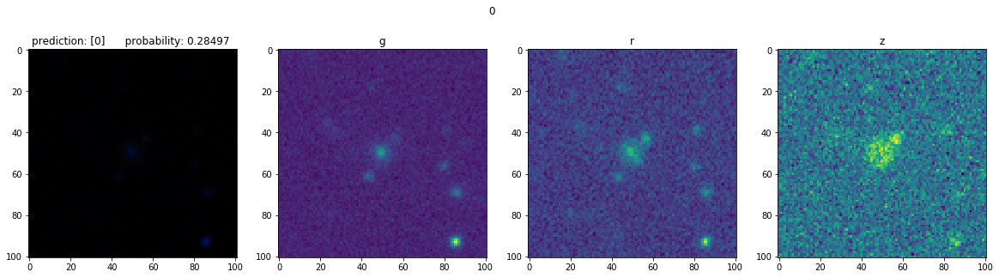

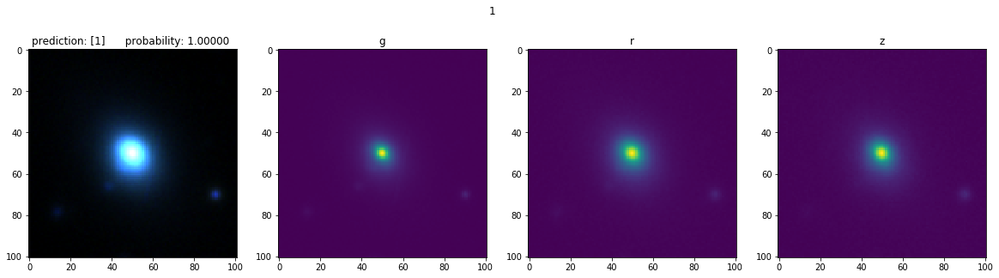

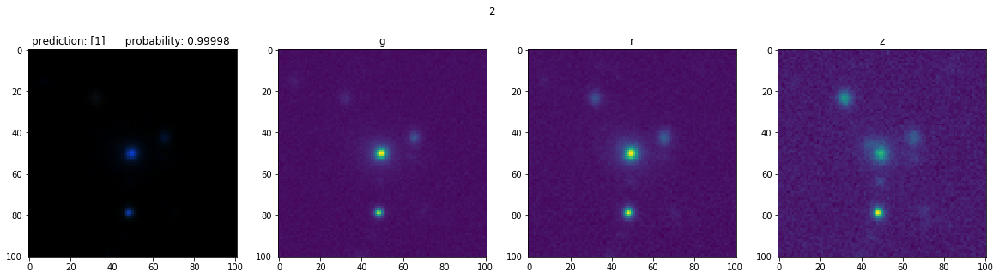

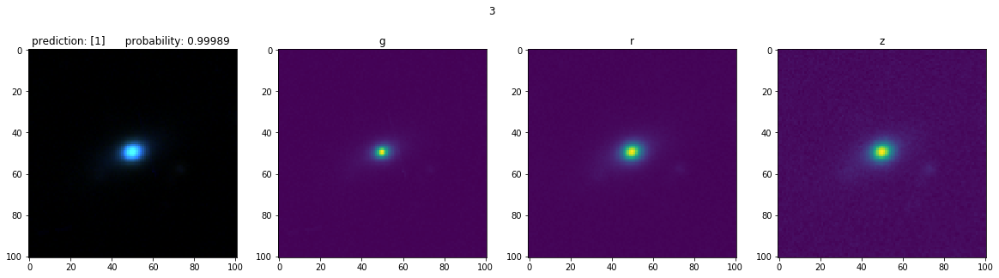

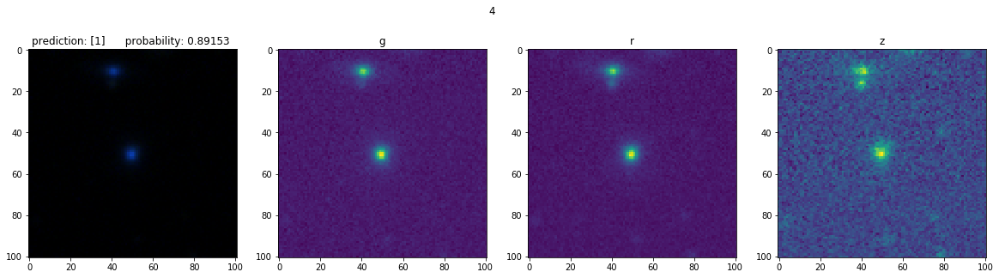

...

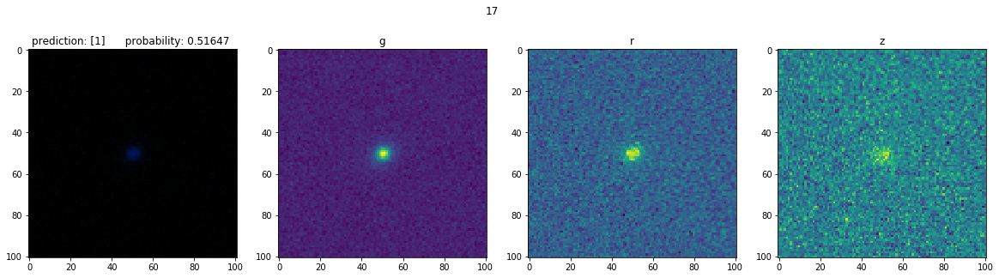

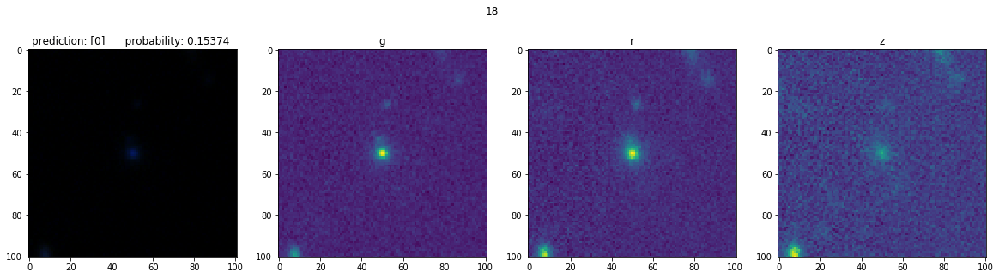

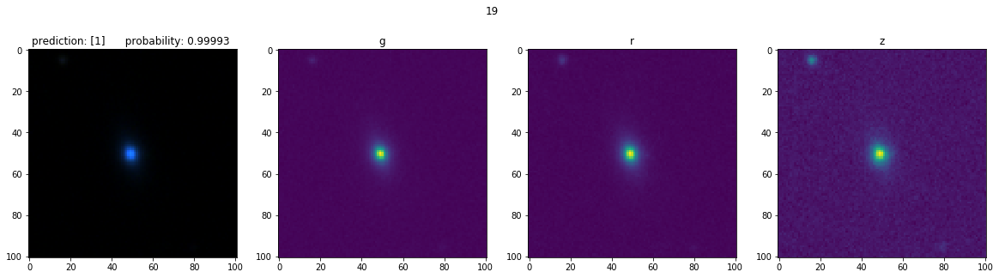

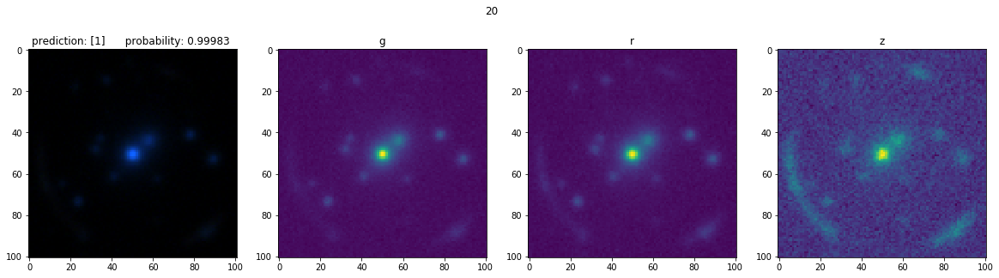

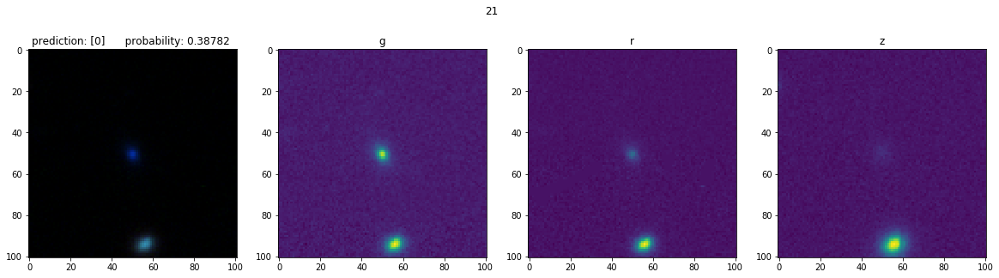

In [61]:
#show lenses and scores
for a in range(22):
    plt.figure(figsize=(20,5))
    plt.suptitle(a)
    plt.subplot(141)
    plt.title('prediction: '+ str(prediction[a])+'      probability: {0:.5f} '.format(float(proba[a]))) 
    plt.imshow(x_lens_test[a].T)
    plt.subplot(142)
    plt.title('g')
    plt.imshow(x_lens_test[a,2,:,:].T)
    plt.subplot(143)
    plt.title('r')
    plt.imshow(x_lens_test[a,1,:,:].T)
    plt.subplot(144)
    plt.title('z')
    plt.imshow(x_lens_test[a,0,:,:].T)
    plt.show()


In [77]:
model.predict_proba(x_lens_test[9].reshape(1,3,101,101)*2)

array([[ 0.97778237]], dtype=float32)

In [79]:
x_nonlens_test = np.zeros((78,3,101,101))

In [80]:
for k in range(x_nonlens_test.shape[0]):
    x_nonlens_test[k] = fits.getdata('/Users/Chris/Desktop/DECals_set/Non-Lenses/images/cutout_{:06d}.fits'.format(k+int(np.max(selected_ims))))


In [83]:
prediction_nonlens = model.predict(x_nonlens_test)
proba_nonlens = model.predict_proba(x_nonlens_test)

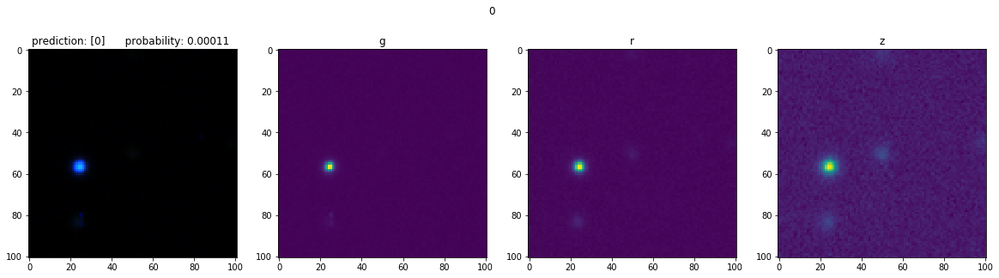

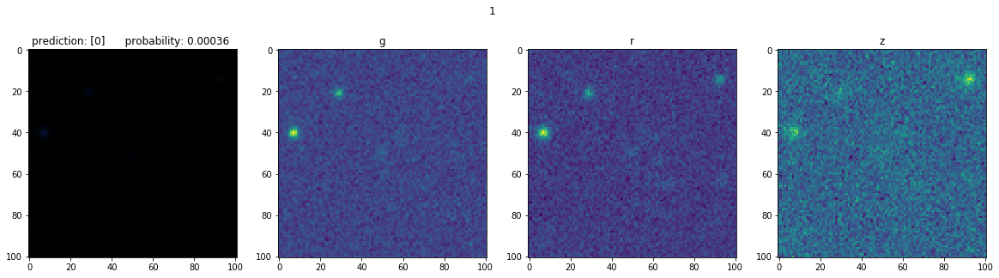

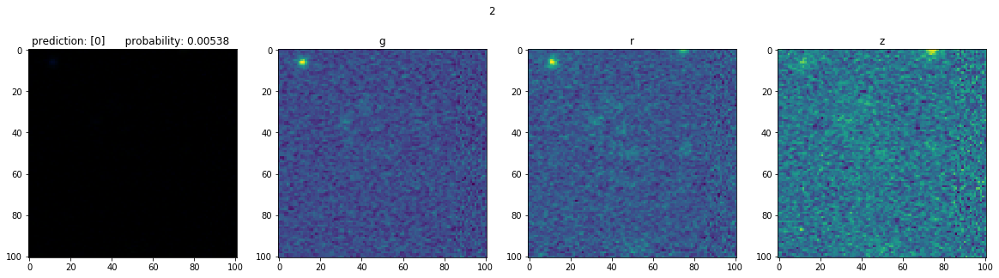

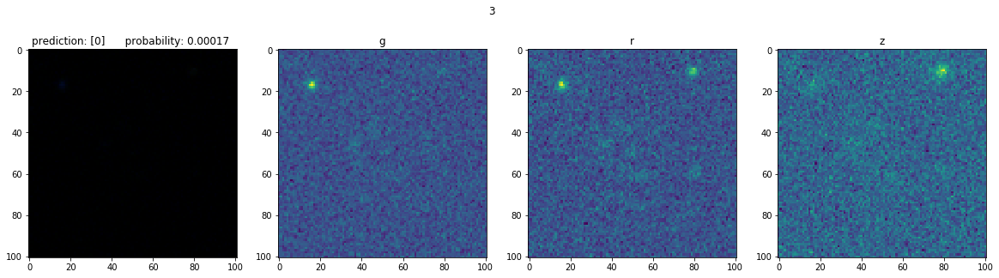

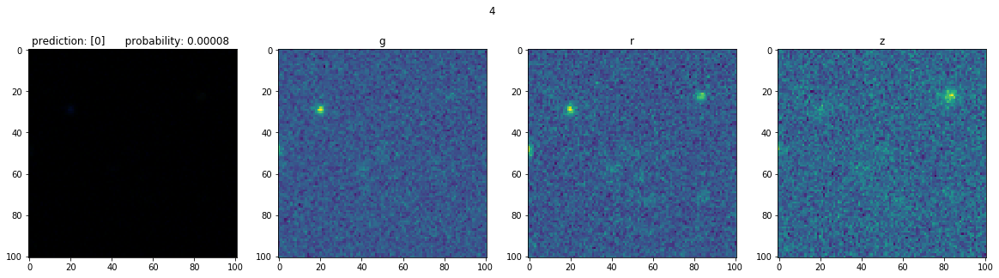

...

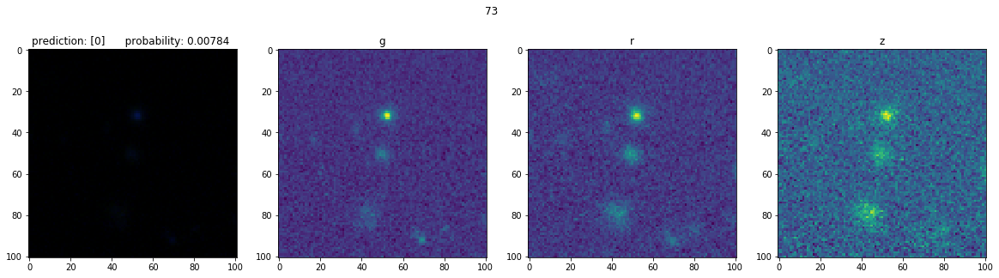

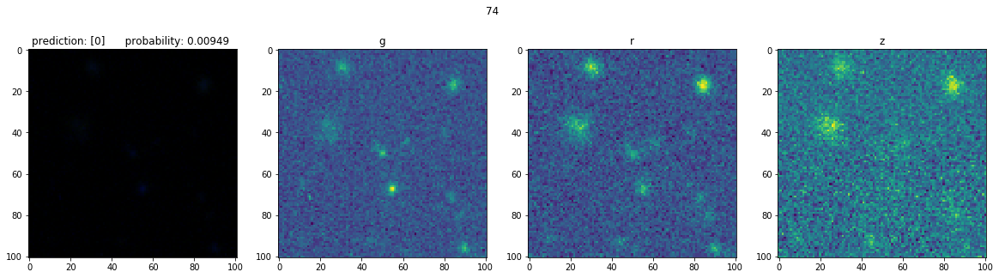

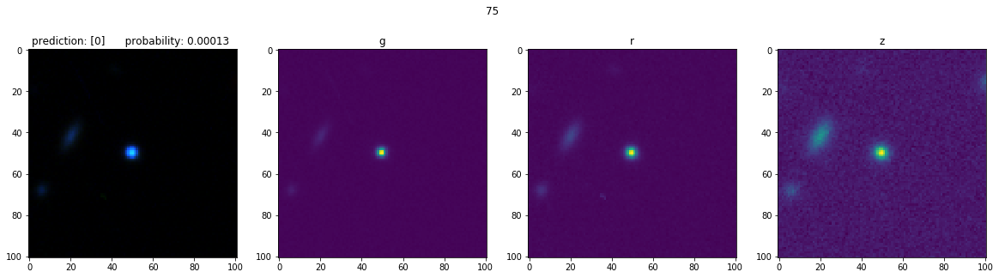

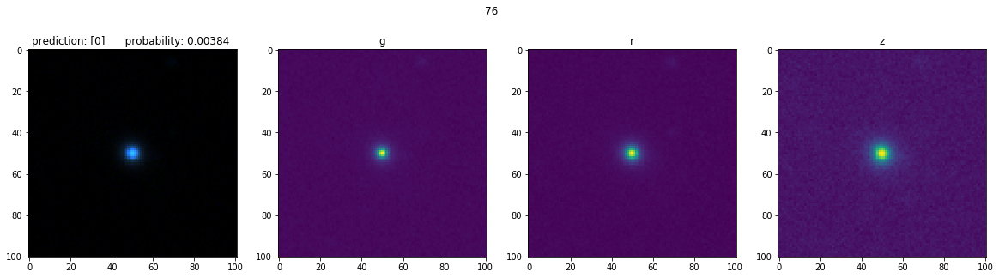

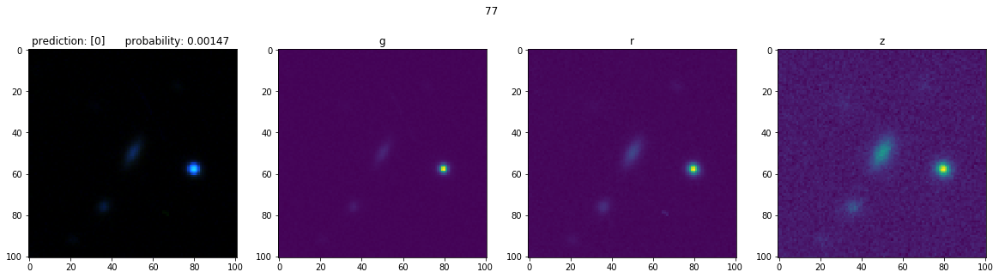

In [84]:
#show lenses and scores
for b in range(78):
    plt.figure(figsize=(20,5))
    plt.suptitle(b)
    plt.subplot(141)
    plt.title('prediction: '+ str(prediction_nonlens[b])+'      probability: {0:.5f} '.format(float(proba_nonlens[b]))) 
    plt.imshow(x_nonlens_test[b].T)
    plt.subplot(142)
    plt.title('g')
    plt.imshow(x_nonlens_test[b,2,:,:].T)
    plt.subplot(143)
    plt.title('r')
    plt.imshow(x_nonlens_test[b,1,:,:].T)
    plt.subplot(144)
    plt.title('z')
    plt.imshow(x_nonlens_test[b,0,:,:].T)
    plt.show()


In [104]:
prediction_nonlens = model.predict(x_nonlens_test)
print np.sum(prediction_nonlens)/float(x_nonlens_test.shape[0])

0.0


In [85]:
x_test = np.concatenate((x_lens_test,x_nonlens_test))

In [86]:
y_nonlens_test = np.zeros((x_nonlens_test.shape[0],1))

In [87]:
y_test = np.concatenate((y_lens_test,y_nonlens_test ))

In [88]:
x_test, none, y_test, none = train_test_split(x_test, y_test, test_size=0.0, shuffle = True)

In [89]:
print x_test.shape
print y_test.shape
print np.sum(y_test)

(100, 3, 101, 101)
(100, 1)
22.0


In [90]:
tpr,fpr,th = model.eval_ROC(x_test,y_test)


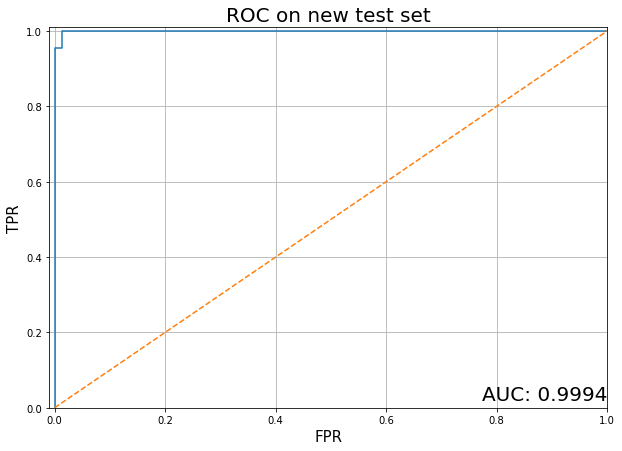

In [91]:
from sklearn import metrics
roc_auc = metrics.auc(fpr, tpr)
plt.figure(figsize= (10,7))
plt.title('ROC on new test set', fontsize=20)
plt.plot(fpr,tpr)
plt.xlabel('FPR', fontsize=15)
plt.ylabel('TPR', fontsize=15)
plt.xlim(0,1)
plt.ylim(0,1.)
plt.plot([0, 1], [0, 1], linestyle='--')
plt.xlim([-0.01, 1.0])
plt.ylim([0.0, 1.01])
plt.text(1, 0.01, 'AUC: ' + str("%.4f" % roc_auc),
        verticalalignment='bottom', horizontalalignment='right', fontsize=20)
plt.grid(True)

plt.show()

# Testing on GroundBased images:


In [54]:
imgs = 100
cat = Table.read('//Volumes/CJSTORFER/GroundBasedTraining/classifications.csv')
cat= cat[0:imgs]

In [81]:
ims = np.zeros((imgs, 3, 101, 101))
counter = 0


for i, id in enumerate(cat['ID']):
    if (i%10 == 0) and (i!=0):
        counter +=1
        print str(counter)+"0 done."
    for j, b in enumerate(['R', 'I', 'G']):
        ims[i, j] = fits.getdata('//Volumes/CJSTORFER/GroundBasedTraining/Public/Band'+str(j+1)+'/imageSDSS_'+b+'-'+str(id)+'.fits')
        cat['image'] = ims

cat.write('/Users/Chris/Desktop/catalogs_'+str(imgs)+'_RGB.hdf5', path='/ground', append=True)
print "Done !"

10 done.
20 done.
30 done.
40 done.
50 done.
60 done.
70 done.
80 done.
90 done.
Done !


In [82]:
from astropy.table import Table

d = Table.read(export_path+'catalogs_'+str(imgs)+'_RGB.hdf5', path='/ground')  # Path to be adjusted on your machine
print d['image'].shape

x_CMU = np.asarray(d['image']).reshape((-1,3,101,101))
print x.shape

y_CMU = np.asarray(d['is_lens']).reshape((-1,1))
print y.shape

(100, 3, 101, 101)
(100, 3, 101, 101)
(100, 1)


In [83]:
vmin=-1e-9
vmax=1e-9
scale=100

mask = np.where(x_CMU == 100)

x_CMU[mask] = 0

x_CMU = np.clip(x_CMU, vmin, vmax)/vmax * 100

In [84]:
tpr_CMU,fpr_CMU,th_CMU = model.eval_ROC(x_CMU,y_CMU)


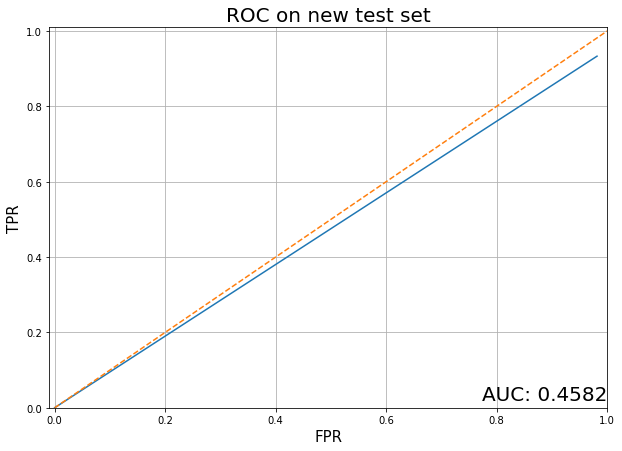

In [85]:
from sklearn import metrics
roc_auc = metrics.auc(fpr_CMU, tpr_CMU)
plt.figure(figsize= (10,7))
plt.title('ROC on new test set', fontsize=20)
plt.plot(fpr_CMU,tpr_CMU)
plt.xlabel('FPR', fontsize=15)
plt.ylabel('TPR', fontsize=15)
plt.xlim(0,1)
plt.ylim(0,1.)
plt.plot([0, 1], [0, 1], linestyle='--')
plt.xlim([-0.01, 1.0])
plt.ylim([0.0, 1.01])
plt.text(1, 0.01, 'AUC: ' + str("%.4f" % roc_auc),
        verticalalignment='bottom', horizontalalignment='right', fontsize=20)
plt.grid(True)

plt.show()

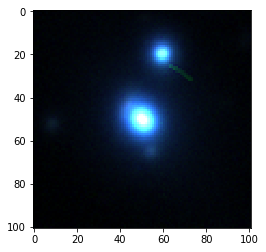

In [88]:
plt.imshow(fits.getdata('/Users/Chris/Desktop/DECals_set/Lenses/gradeA/fits_images/lens_cutout_000023.fits').T)